## Volume of Nile River at Aswan

In [8]:
import json 
import pandas as pd 
import numpy as np 
import math 
import itertools 
import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure 
from load_dataset import TimeSeries 

In [9]:
import warnings
warnings.filterwarnings('ignore')

In [10]:
# True labels
annotations = pd.read_json('TCPD-master/annotations.json')
annotations[['nile']]

,nile
6,[]
7,[28]
8,[]
9,NaN
10,NaN
12,[28]
13,[28]
14,NaN


In [11]:
# List true changepoints
annotator_df = pd.read_json('TCPD-master/annotations.json') 
nile_df = annotator_df[['nile']] 
list2d = np.array(nile_df).flatten() 
list2d = [l for l in list2d if (type(l)==list)] 
nile_annotation_lst = list(itertools.chain.from_iterable(list2d))
nile_annotation_lst

[28, 28, 28]

t                    int64
Volume at Aswan    float64
date                object
dtype: object


<Figure size 960x480 with 0 Axes>

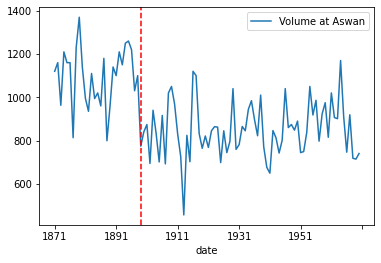

In [12]:
# Plot true changepoints
from load_dataset import TimeSeries
ts = TimeSeries.from_json('TCPD-master/datasets/nile/nile.json')
nile_df = ts.df
nile_df['date'] =ts.datestr
print(nile_df.dtypes)
figure(figsize=(12, 6), dpi=80)
nile_df.plot('date', 'Volume at Aswan')
nile_df['is_CPD'] = np.where(nile_df.t.isin(nile_annotation_lst), 1,0)
plt.axvline(nile_df.loc[nile_df['is_CPD']==1][['t']].values[0], color='red', linestyle='--')

In [6]:
nile_df[28:29]

,t,Volume at Aswan,date,is_CPD
28,28,774.0,1899,1


In [13]:
nile_df.shape

(100, 4)

total changepoints-->  4


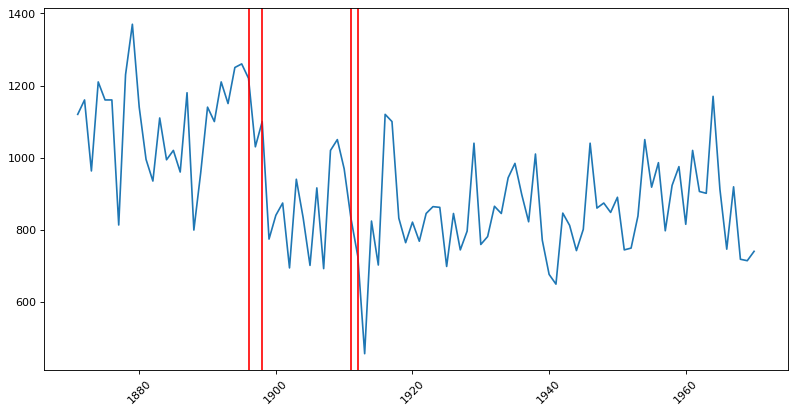

In [23]:
from kats.detectors.bocpd import BOCPDetector, BOCPDModelType, TrendChangeParameters
from kats.consts import TimeSeriesData

df = nile_df
df['time']= pd.to_datetime(df['date'])


tsd = TimeSeriesData(df.loc[:,['time','Volume at Aswan']])

# Initialize the detector
detector = BOCPDetector(tsd)


changepoints = detector.detector(
    model=BOCPDModelType.NORMAL_KNOWN_MODEL, # this is the default choice
    #model_parameters=[known_prec_multiplier=1.0]
    lag=10,
    changepoint_prior=.01,#prior belief
    threshold=.1
)

print('total changepoints--> ', len(changepoints))

figure(figsize=(12, 6), dpi=80)
# Plot the data
plt.xticks(rotation=45)
detector.plot(changepoints)
plt.show()

In [9]:
changepoints
type(changepoints[0][0])

kats.consts.TimeSeriesChangePoint

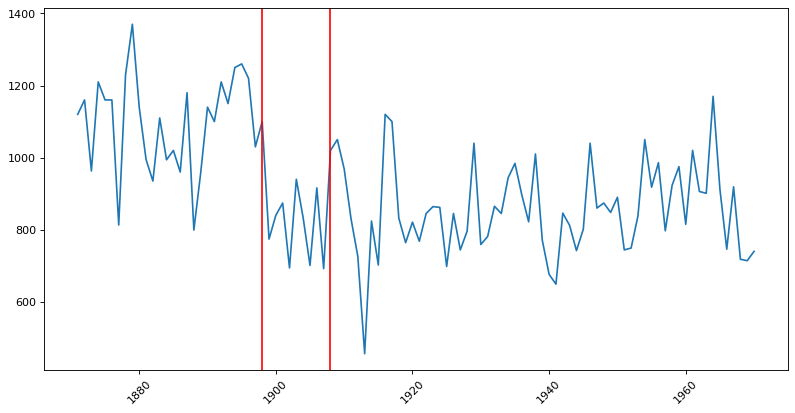

In [81]:
#Robust Stat Detector
from kats.detectors.robust_stat_detection import RobustStatDetector

detector = RobustStatDetector(tsd)
change_points = detector.detector(comparison_window=8, smoothing_window_size=10, p_value_cutoff=0.05)
figure(figsize=(12, 6), dpi=80)
plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

In [11]:
change_points

[(TimeSeriesChangePoint(start_time: 1914-01-01T00:00:00.000000000, end_time: 1914-01-01T00:00:00.000000000, confidence: 0.9716351783879331),
  <kats.detectors.robust_stat_detection.RobustStatMetadata at 0x7fd8b4ed4fa0>)]

total changepoints-->  1


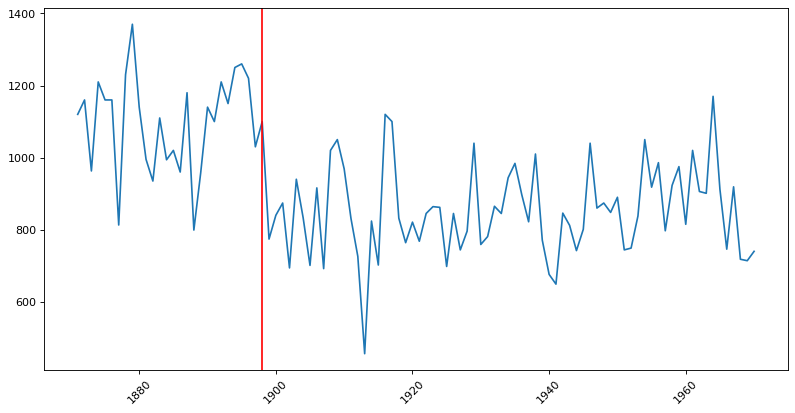

In [12]:
# CUSUM
from kats.detectors.cusum_detection import CUSUMDetector


# Initialize the detector
detector = CUSUMDetector(tsd)

change_points = detector.detector(threshold=0.05)

print('total changepoints--> ', len(change_points))

figure(figsize=(12, 6), dpi=80)
# Plot the data
plt.xticks(rotation=45)
detector.plot(change_points)
plt.show()

In [13]:
change_points

[(TimeSeriesChangePoint(start_time: 1898-01-01 00:00:00, end_time: 1898-01-01 00:00:00, confidence: 0.9999999999996476),
  <kats.detectors.cusum_detection.CUSUMMetadata at 0x7fd8b4ed4be0>)]

#### Annotation -> 1899
#### BOCPD -> 1898
#### RobustStatDetector -> 1914
#### CUSUM -> 1898

In [40]:
#Hyperparameter tuning for BOCPD model


# Initialize the detector
detector = BOCPDetector(tsd)

hp_list = []
#hp_result['true_CP_detected'] = []
lag = 0
changepoint_prior = 0.01
hp_value = {}
for i in range(0,10):
    for j in range(1, 6):
        lag = i
        changepoint_prior = j*0.1
        changepoints = detector.detector(
            model=BOCPDModelType.NORMAL_KNOWN_MODEL,
            lag=lag,
            changepoint_prior=changepoint_prior,#prior belief
        )
            
        hp_value = {'lag': lag, 'changepoint_prior': changepoint_prior, 'CP': str(changepoints)[35:40], 'confidence': str(changepoints)[120:126]}
        #print(changepoints)
        hp_list.append(hp_value)



In [41]:
hp_result = pd.DataFrame(hp_list)
hp_result

,lag,changepoint_prior,CP,confidence
0,0,0.1,1898,0.8528
1,0,0.2,1898,0.8528
2,0,0.3,1898,0.8528
3,0,0.4,1898,0.8528
4,0,0.5,1898,0.8528
5,1,0.1,1898,0.8528
6,1,0.2,1898,0.8528
7,1,0.3,1898,0.8528
8,1,0.4,1898,0.8528
9,1,0.5,1898,0.8528


In [42]:
hp_result.to_csv('Nile_hp_tuning.csv')

In [21]:
#Hyperparameter tuning for BOCPD model
def hp_tuning_BOCPD(tsd):
    

    # Initialize the detector
    detector = BOCPDetector(tsd)

    hp_list = []
    #hp_result['true_CP_detected'] = []
    lag = 0
    changepoint_prior = 0.01
    hp_value = {}
    for i in range(0,df.shape[0]):
        for j in range(1, 6):
            lag = i
            changepoint_prior = j*0.1
            changepoints = detector.detector(
                model=BOCPDModelType.NORMAL_KNOWN_MODEL,
                lag=lag,
                changepoint_prior=changepoint_prior,#prior belief
            )
            hp_value = {'lag': lag, 'changepoint_prior': changepoint_prior, 'CP': str(changepoints)[37:42], 'confidence': str(changepoints)[121:127]}
            #print(changepoints)
            hp_list.append(hp_value)
    return pd.DataFrame(hp_list)




In [43]:
import hiplot as hip

iris_hiplot = hip.Experiment.from_csv('Nile_hp_tuning.csv')
iris_hiplot.display()

<IPython.core.display.Javascript object>

In [15]:
from kats.detectors.bocpd import BOCPDetector, BOCPDModelType, TrendChangeParameters
from kats.consts import TimeSeriesData

df = nile_df
df['time']= pd.to_datetime(df['date'])
tsd = TimeSeriesData(df.loc[:,['time','Volume at Aswan']])

In [18]:
#def to parse list of changepoints and confidence
def parse_CPs(changepoints):    
    cp_list = []
    for cp in changepoints:
        changepoint = str(cp[0])[34:38]
        confidence = str(cp[0])[119:125]
        cp_list.append(changepoint)
    return cp_list

In [24]:
cp = parse_CPs(changepoints)
print(cp)

['1896', '1898', '1911', '1912']


In [25]:
#Hyperparameter tuning for BOCPD model
def hp_tuning_BOCPD(tsd):

    # Initialize the detector
    detector = BOCPDetector(tsd)

    hp_list = []
    #hp_result['true_CP_detected'] = []
    lag = 0
    changepoint_prior = 0.01
    hp_value = {}
    for i in range(0,df.shape[0]):
        for j in range(1, 6):
            for k in range(1, 10):
                threshold = k*0.1
                lag = i
                changepoint_prior = j*0.1
                changepoints = detector.detector(
                    model=BOCPDModelType.NORMAL_KNOWN_MODEL,
                    lag=lag,
                    changepoint_prior=changepoint_prior,#prior belief
                    threshold=.3
                )
                hp_value = {'lag': lag, 'changepoint_prior': changepoint_prior, 'threshold': threshold, 'CP': parse_CPs(changepoints)}
                hp_list.append(hp_value)
    return pd.DataFrame(hp_list)




In [26]:
Nile_hp = hp_tuning_BOCPD(tsd)

In [29]:
Nile_hp = Nile_hp[['lag', 'changepoint_prior', 'threshold', 'CP']]
Nile_hp.to_csv("nile_hp.csv")

In [30]:
import hiplot as hip

iris_hiplot = hip.Experiment.from_csv('nile_hp.csv')
iris_hiplot.display()

<IPython.core.display.Javascript object>

In [82]:
#Robust Stat Detector
from kats.detectors.robust_stat_detection import RobustStatDetector

df = nile_df
df['time']= pd.to_datetime(df['date'])
tsd = TimeSeriesData(df.loc[:,['time','Volume at Aswan']])

#Hyperparameter tuning for RSD model
def hp_tuning_RSD(df):

    # Initialize the detector
    detector = RobustStatDetector(tsd)

    hp_list = []
    #hp_result['true_CP_detected'] = []
    comparison_window = 0
    smoothing_window_size = 0
    p_value_cutoff = 0.05
    hp_value = {}
    for i in range(1,101):
        for j in range(1, 101):
            #for k in range(1, 10):
                #threshold = k*0.1
            smoothing_window_size = 10
            comparison_window = j
            change_points = detector.detector(
                comparison_window=comparison_window,
                smoothing_window_size=smoothing_window_size,
                p_value_cutoff=0.05
            )
            hp_value = {'comparison_window': comparison_window, 'smoothing_window': smoothing_window_size, 'CP': parse_CPs(change_points)}
            hp_list.append(hp_value)
    return pd.DataFrame(hp_list)

In [83]:
Nile_hp_rsd = hp_tuning_RSD(tsd)

In [84]:
Nile_hp_rsd.to_csv("nile_hp_rsd.csv")

In [85]:
import hiplot as hip

cp_hiplot = hip.Experiment.from_csv('nile_hp_rsd.csv')
cp_hiplot.display()

<IPython.core.display.Javascript object>

In [77]:
#Robust Stat Detector
from kats.detectors.robust_stat_detection import RobustStatDetector

df = nile_df
df['time']= pd.to_datetime(df['date'])
tsd = TimeSeriesData(df.loc[:,['time','Volume at Aswan']])

#Hyperparameter tuning for RSD model
def hp_tuning_RSD(df):

    # Initialize the detector
    detector = RobustStatDetector(tsd)

    hp_list = []
    #hp_result['true_CP_detected'] = []
    comparison_window = 0
    smoothing_window_size = 0
    p_value_cutoff = 0.05
    hp_value = {}
    for j in range(1, 101):
        smoothing_window_size = j
        comparison_window = 8
        change_points = detector.detector(
            comparison_window=comparison_window,
            smoothing_window_size=smoothing_window_size,
            p_value_cutoff=0.05
        )
        hp_value = {'comparison_window': comparison_window, 'smoothing_window': smoothing_window_size, 'CP': parse_CPs(change_points)}
        hp_list.append(hp_value)
    return pd.DataFrame(hp_list)

In [78]:
Nile_hp_rsd = hp_tuning_RSD(tsd)

In [79]:
Nile_hp_rsd.to_csv("nile_hp_rsd.csv")

In [80]:
import hiplot as hip

cp_hiplot = hip.Experiment.from_csv('test.csv')
cp_hiplot.display()

<IPython.core.display.Javascript object>